<div style="color:#FF1F26;
           display:fill;
           border-style: solid;
           border-color:#C1C1C1;
           font-size:16px;
           font-family:Calibri;
           background-color:#B75351;">
<h2 style="text-align: center;
           padding: 10px;
           color:#FFFFFF;">
======= Plant Disease Classification using CNN & TransfearLearning with 95%+ Accuracy =======
</h2>
</div>


<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700"> Table of Contents</div>


<a id="toc"></a>

- [1. Setup](#1)
  - [1.1. Package and Library](#1.1)
  - [1.2. Load the Data](#1.2)
- [2. Data Explorations](#2)
- [3. Image Processing](#3)
- [4. Spliting](#4)
- [5. CNN Model](#5)
- [6. Transfear Learning](#6)
- [7. Evaluation](#7)
- [8. Predected Images](#8)


# <a id="1"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">1. Setup</div>


<a id="1.1"></a>

# <b><span style='color:#8D6D9B'>1.1. Package and Library</span></b>


In [1]:
import os
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

<a id="1.2"></a>

# <b><span style='color:#8D6D9B'>1.2. Load The Data</span></b>


In [2]:
dataDir = 'datasets\\tomato'
selectedClasses = ['Tomato_healthy',
                   'Tomato__Target_Spot',
                   'Tomato__Tomato_mosaic_virus',
                   'Tomato__Tomato_YellowLeaf__Curl_Virus',
                   'Tomato_Bacterial_spot',
                #    'Tomato_Early_blight',
                #    'Tomato_Late_blight',
                #    'Tomato_Leaf_Mold',
                #    'Tomato_Septoria_leaf_spot',
                #    'Tomato_Spider_mites_Two_spotted_spider_mite',
                   ]

In [3]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :                  # Select you classes above
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)            # Shuffle

df

,imgPath,label
0,datasets\tomato\Tomato__Tomato_YellowLeaf__Cur...,Tomato__Tomato_YellowLeaf__Curl_Virus
1,datasets\tomato\Tomato__Target_Spot\586a0ee5-3...,Tomato__Target_Spot
2,datasets\tomato\Tomato_healthy\4a1e2b71-992a-4...,Tomato_healthy
3,datasets\tomato\Tomato__Tomato_YellowLeaf__Cur...,Tomato__Tomato_YellowLeaf__Curl_Virus
4,datasets\tomato\Tomato__Target_Spot\63e1a2ad-a...,Tomato__Target_Spot
...,...,...
8697,datasets\tomato\Tomato__Tomato_YellowLeaf__Cur...,Tomato__Tomato_YellowLeaf__Curl_Virus
8698,datasets\tomato\Tomato__Target_Spot\ec7551da-6...,Tomato__Target_Spot
8699,datasets\tomato\Tomato_Bacterial_spot\9f3bb55d...,Tomato_Bacterial_spot
8700,datasets\tomato\Tomato__Tomato_YellowLeaf__Cur...,Tomato__Tomato_YellowLeaf__Curl_Virus


In [4]:
len(df)

8702

# <a id="2"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">2. Data Explorations</div>


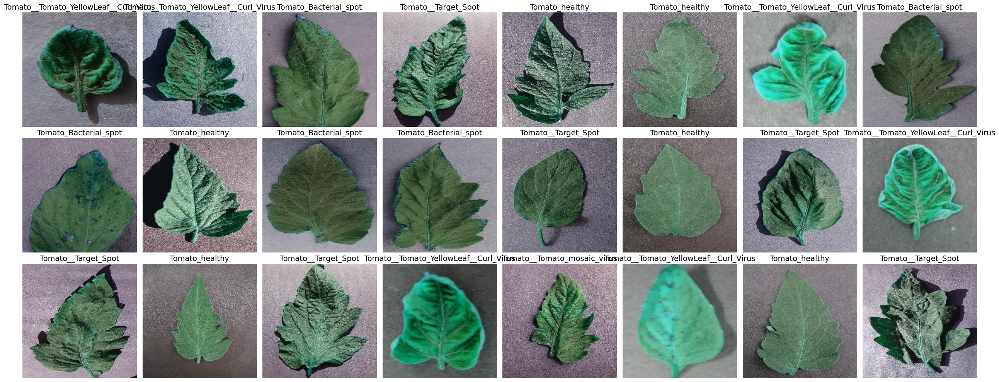

In [5]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

# <a id="3"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">3. Image Processing</div>


In [6]:
df['label'] = df['label'].replace({'Tomato_healthy':0,
                                    'Tomato__Target_Spot':1,
                                    'Tomato__Tomato_mosaic_virus':2,
                                    'Tomato__Tomato_YellowLeaf__Curl_Virus':3,
                                    'Tomato_Bacterial_spot':4,
                                    # 'Tomato_Early_blight':5,
                                    # 'Tomato_Late_blight':6,
                                    # 'Tomato_Leaf_Mold':7,
                                    # 'Tomato_Septoria_leaf_spot':8,
                                    # 'Tomato_Spider_mites_Two_spotted_spider_mite':9,
                                    }).astype(int)

C:\Users\sarth\AppData\Local\Temp\ipykernel_13652\2367527012.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'Tomato_healthy':0,


In [7]:
IMG_SIZE = (150,150)   # to free some resources and reduce the execution time
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    imgs.append(img)

100%|██████████| 8702/8702 [00:23<00:00, 367.17it/s]


All the images has the same shape


In [8]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)

(8702, 8702)

In [9]:
images = images / 255.0         # normalize from 0 --> 255 to 0 --> 1  to reduce the execution time 

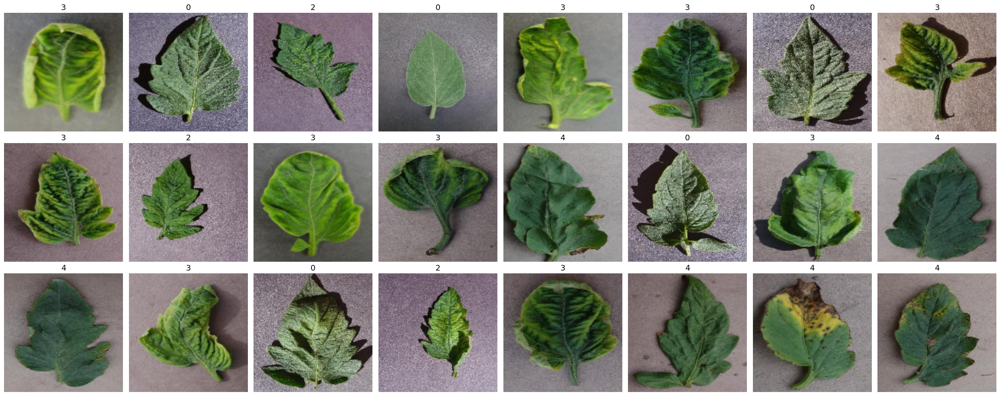

In [10]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label, fontsize=14)
    axs[i].axis('off')
    

plt.tight_layout()
plt.show()

# <a id="4"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">4. Spliting</div>


In [11]:
# Spliting 

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (6961, 150, 150, 3)
Shape of X_test : (1741, 150, 150, 3)
Shape of y_train : (6961,)
Shape of y_test : (1741,)


# <a id="5"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">5. CNN Model</div>


In [12]:
with tf.device('/GPU:0'):
    kerasModel = Sequential([
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID' ,input_shape=(150,150,3)), # padding ='SAME' for using padding
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        Flatten(),

        Dense(128,activation='relu'),
        Dense(6 ,activation='softmax')
    ])

c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
kerasModel.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [14]:
history = kerasModel.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=10,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 77s 601ms/step - accuracy: 0.7277 - loss: 0.7257 - val_accuracy: 0.2010 - val_loss: 6.1948
Epoch 2/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 65s 580ms/step - accuracy: 0.9135 - loss: 0.2436 - val_accuracy: 0.2240 - val_loss: 5.8614
Epoch 3/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 65s 579ms/step - accuracy: 0.9330 - loss: 0.1840 - val_accuracy: 0.3676 - val_loss: 5.2049
Epoch 4/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 66s 585ms/step - accuracy: 0.9436 - loss: 0.1548 - val_accuracy: 0.2943 - val_loss: 3.4863
Epoch 5/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 64s 574ms/step - accuracy: 0.9562 - loss: 0.1138 - val_accuracy: 0.6992 - val_loss: 0.9424
Epoch 6/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 84s 587ms/step - accuracy: 0.9456 - loss: 0.1382 - val_accuracy: 0.9038 - val_loss: 0.2836
Epoch 7/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 66s 586ms/step - accuracy: 0.9633 - loss: 0.1028 - val_accuracy: 0.9275 - val_loss: 0.2161
Epoch 8/10
112/112 ━━━━━━━━━━━━━━━━━━━━ 66s 587ms/step - accuracy: 0.9602 - loss: 0

In [15]:
y_pred = kerasModel.predict(X_test)

55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step


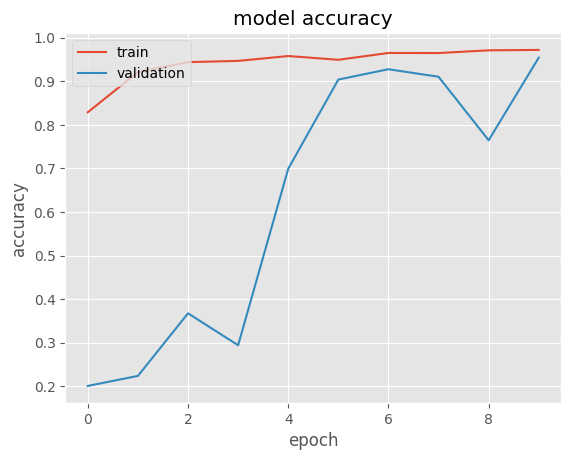

In [16]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [17]:
y_test[:10]

array([0, 3, 4, 3, 0, 4, 1, 3, 3, 4])

In [18]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[0, 3, 4, 3, 0, 4, 1, 3, 3, 4]

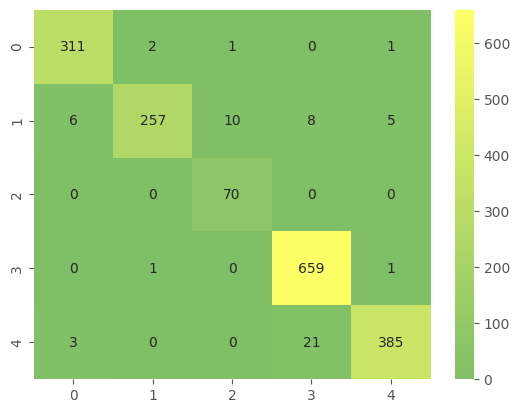

In [19]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [20]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       315
           1       0.99      0.90      0.94       286
           2       0.86      1.00      0.93        70
           3       0.96      1.00      0.98       661
           4       0.98      0.94      0.96       409

    accuracy                           0.97      1741
   macro avg       0.95      0.96      0.96      1741
weighted avg       0.97      0.97      0.97      1741



# <a id="6"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">6. Transfear Learning</div>


We will use VGG16 pretrained model


In [21]:
custom_input = Input(shape=(150, 150, 3))           # To customize the input shape of PreTrained model  

with tf.device('/GPU:0'):          # to use GPU
    Model = Sequential([

        VGG16(weights='imagenet', include_top=False, input_tensor=custom_input),
        
        Flatten(),                                     # because we ignore the flatten and dense layers when include_top = False 
        
        Dense(128,activation='relu'),
        
        Dropout(0.2),

        Dense(6 ,activation='softmax')
    ])

In [22]:
VGG16Layers = Model.layers[0]
for layer in VGG16Layers.layers[1:-3]:           # freez all layers except the first and last 3 layers, we will make them trainable (weghts changes with training)
    layer.trainable = False

In [23]:
Model.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [24]:
history = Model.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=10,
                         batch_size=100, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/10


c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_24']. Received: the structure of inputs=*
  warnings.warn(


56/56 ━━━━━━━━━━━━━━━━━━━━ 386s 7s/step - accuracy: 0.5814 - loss: 1.2709 - val_accuracy: 0.9390 - val_loss: 0.1809
Epoch 2/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 378s 7s/step - accuracy: 0.9279 - loss: 0.1975 - val_accuracy: 0.9404 - val_loss: 0.1624
Epoch 3/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 376s 7s/step - accuracy: 0.9603 - loss: 0.1124 - val_accuracy: 0.9627 - val_loss: 0.0992
Epoch 4/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 378s 7s/step - accuracy: 0.9840 - loss: 0.0458 - val_accuracy: 0.9720 - val_loss: 0.0803
Epoch 5/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 377s 7s/step - accuracy: 0.9877 - loss: 0.0422 - val_accuracy: 0.9655 - val_loss: 0.0987
Epoch 6/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 374s 7s/step - accuracy: 0.9849 - loss: 0.0404 - val_accuracy: 0.9655 - val_loss: 0.1061
Epoch 7/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 375s 7s/step - accuracy: 0.9912 - loss: 0.0311 - val_accuracy: 0.9770 - val_loss: 0.0740
Epoch 8/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 376s 7s/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.9763 - val_loss: 0.

In [25]:
Model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,302,356 (104.15 MB)

 Trainable params: 5,769,094 (22.01 MB)

 Non-trainable params: 9,995,072 (38.13 MB)

 Optimizer params: 11,538,190 (44.01 MB)

# <a id="7"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">7. Evaluation</div>


In [26]:
y_pred = Model.predict(X_test)

55/55 ━━━━━━━━━━━━━━━━━━━━ 53s 951ms/step


In [27]:
print(f'Prediction items : \n{y_pred[:5]}')

Prediction items : 
[[9.80710030e-01 1.89306233e-02 3.51997791e-04 1.71423073e-06
  4.36106575e-06 1.27063345e-06]
 [3.85798188e-07 1.93683663e-04 1.10044951e-08 3.16081643e-01
  6.83724165e-01 6.62848905e-08]
 [3.01117309e-09 3.92448555e-06 2.18410411e-11 5.72604506e-07
  9.99995470e-01 1.78502005e-10]
 [8.19764978e-10 3.52433915e-07 1.25852635e-08 9.99999404e-01
  2.04012352e-07 3.20934029e-10]
 [9.99922395e-01 7.71375417e-05 5.26674285e-07 8.40514602e-11
  3.26669572e-12 1.01820228e-11]]


In [28]:
print(f'Prediction items after rounding :  \n{np.round(y_pred[:5])}')

Prediction items after rounding :  
[[1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0.]]


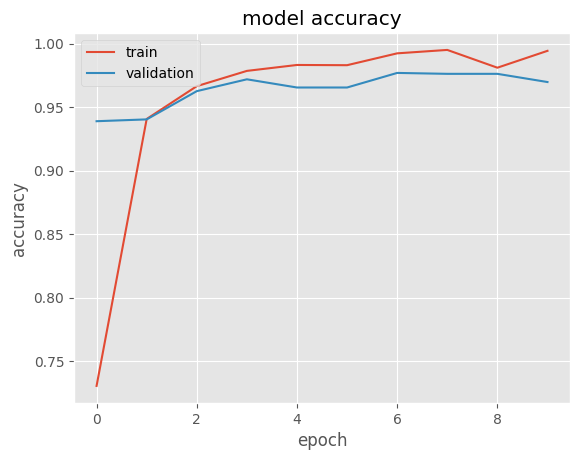

In [29]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [30]:
y_test[:10]

array([0, 3, 4, 3, 0, 4, 1, 3, 3, 4])

In [31]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[0, 4, 4, 3, 0, 4, 1, 3, 3, 4]

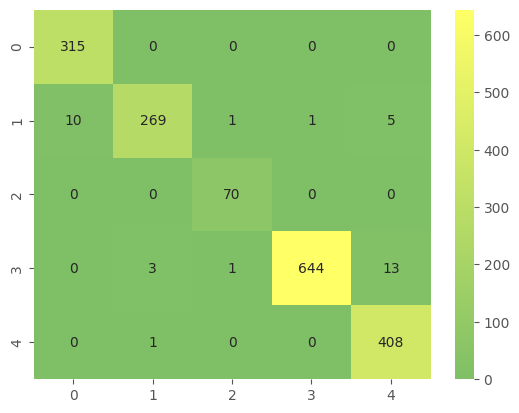

In [32]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [33]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.97      1.00      0.98       315
           1       0.99      0.94      0.96       286
           2       0.97      1.00      0.99        70
           3       1.00      0.97      0.99       661
           4       0.96      1.00      0.98       409

    accuracy                           0.98      1741
   macro avg       0.98      0.98      0.98      1741
weighted avg       0.98      0.98      0.98      1741



# <a id="8"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">8. Predected Images</div>


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


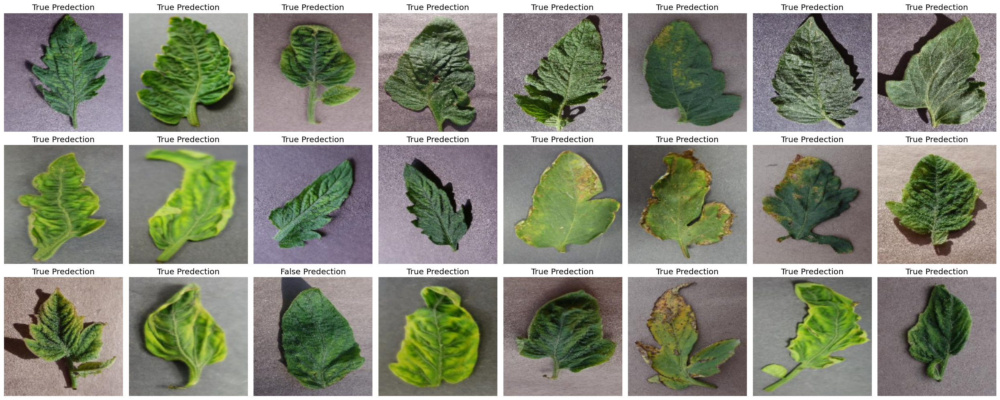

In [34]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))
    img = X_test[index]
    label = y_test[index]
    reshapedImg = img.reshape(1,150,150,3)
    pred = np.argmax(Model.predict(reshapedImg))
    isPredectedTrue = 'True' if (label == pred) else 'False'
    axs[i].imshow(img)
    axs[i].set_title(f'{isPredectedTrue} Predection')
    axs[i].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()

### If these kernels impress you,give them an <font size="+3" color="red"><b>Upvote</b></font>.<br>


<a href="#toc" class="btn btn-success btn-lg active" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="go to Colors">Go to TOP</a>
